In [2]:
# install dependencies

!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 18752, done.
remote: Counting objects: 100% (312/312), done.
remote: Compressing objects: 100% (184/184), done.
remote: Total 18752 (delta 256), reused 128 (delta 128), pack-reused 18440 (from 4)
Receiving objects: 100% (18752/18752), 17.77 MiB | 20.87 MiB/s, done.
Resolving deltas: 100% (12760/12760), done.
/content/yolov5


In [3]:
%pwd

'/content/yolov5'

In [4]:
%cd /content


/content


In [5]:
%pwd

'/content'

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
!gdown "https://drive.google.com/uc?id=1pcZz8NGrHw5OlRtwLuqrRmGxPlX0_-Xq"

Downloading...
From (original): https://drive.google.com/uc?id=1pcZz8NGrHw5OlRtwLuqrRmGxPlX0_-Xq
From (redirected): https://drive.google.com/uc?id=1pcZz8NGrHw5OlRtwLuqrRmGxPlX0_-Xq&confirm=t&uuid=f82fe6fe-c139-4d0f-8421-a4e86286cdf9
To: /content/Sign language detection.v1i.yolov5pytorch (2).zip
100% 36.4M/36.4M [00:01<00:00, 36.4MB/s]


In [8]:
!unzip -q "/content/Sign language detection.v1i.yolov5pytorch (2).zip" -d "/content/SignLanguageDataset"

In [9]:
# this is the YMAL file we're  loading into this notebook with our data
%cat "/content/SignLanguageDataset/Sign language detection.v1i.yolov5pytorch/data.yaml"

cat: '/content/SignLanguageDataset/Sign language detection.v1i.yolov5pytorch/data.yaml': No such file or directory


In [12]:
# define number of classes based on YAML

import yaml
with open('/content/SignLanguageDataset/data.yaml', 'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

In [13]:
num_classes

'3'

In [14]:
# this is the model configuration we will use
%cat /content/yolov5/models/yolov5s.yaml

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Ultralytics YOLOv5s object detection model with P3/8 - P5/32 outputs
# Model docs: https://docs.ultralytics.com/models/yolov5
# Task docs: https://docs.ultralytics.com/tasks/detect
# Example usage: python train.py --cfg yolov5s.yaml --data coco.yaml

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8 small-object anchors
  - [30, 61, 62, 45, 59, 119] # P4/16 medium-object anchors
  - [116, 90, 156, 198, 373, 326] # P5/32 large-object anchors

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1

In [15]:
# customize iPYthon writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals()))

In [16]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8 small-object anchors
  - [30, 61, 62, 45, 59, 119] # P4/16 medium-object anchors
  - [116, 90, 156, 198, 373, 326] # P5/32 large-object anchors

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]



In [17]:
# train Custom yolov5 detector

# here , we are able to pass a number of argumens:
# img: define input image size
# batch: determine batch size
# epochs: define the number of training epochs. (Note: often, 3000+ are common here!)
# cfg: specify our model configuration
# weights: specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive )
# name : result names
# nosave: only save the filnal checkpoint
# cache: cache images for faster training



In [18]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.8/75.8 kB 7.9 MB/s eta 0:00:00


In [19]:
import ultralytics
print(ultralytics.__version__)

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
8.4.147


In [20]:
!find "/content/SignLanguageDataset/Sign language detection.v1i.yolov5pytorch" -maxdepth 2 -type d

find: ‘/content/SignLanguageDataset/Sign language detection.v1i.yolov5pytorch’: No such file or directory


In [23]:
!ls /content/SignLanguageDataset/train/images | head
!ls /content/SignLanguageDataset/valid/images | head
!ls /content/SignLanguageDataset/test/images | head

001_jpg.rf.7ce088853d52a037fd13e2c2e5e5fd6f.jpg
001_jpg.rf.da16ac1a174d147a72cdc02b9783a086.jpg
001_jpg.rf.e61b9e16362b9ed84ed48f86db34782d.jpg
002_jpg.rf.98504e0bb1112adb7b98165c78884ede.jpg
002_jpg.rf.a8db82baf27883aea75cbd5d6bc55fe3.jpg
002_jpg.rf.eeef424db58eb116692e81d4af01b74a.jpg
003_jpg.rf.20fbc0c46857b84c2697d5fa8286aaf8.jpg
003_jpg.rf.397e863b12f51272cbce01ced6d231eb.jpg
003_jpg.rf.4f8d08938b7835273945adddf3792dd9.jpg
004_jpg.rf.01663be1d8829121d5025f36112b81d4.jpg
009_jpg.rf.e87d2420115d9dcdc3be9c5759dd84be.jpg
011_jpg.rf.c1e86680bbde6d6c7cc72dd639356b7d.jpg
014_jpg.rf.66f6bacb9a503c24f7c1867a50cba389.jpg
027_jpg.rf.cf584b9ae85c851da9f2211e9dcd6d8d.jpg
036_jpg.rf.f95500ebb67ffdf4ab9a780cf9202100.jpg
075_jpg.rf.1d47ef7204007c7cf3664efdb52a09fe.jpg
076_jpg.rf.2bb50b90f729e000115ee4b7fb6dbadb.jpg
083_jpg.rf.3baef718ae2929b2193c13ddca5198bd.jpg
087_jpg.rf.3a0269a9c88b8b1f6bf49ad9055f2e89.jpg
093_jpg.rf.1e673f35261125ac9506f75fd7d55091.jpg
023_jpg.rf.c1f52d2c1ec41b95b3b99b6ecb50a

In [25]:
!echo "===== TRAIN ====="
!find /content/SignLanguageDataset/train/images -type f | wc -l

!echo "===== VALID ====="
!find /content/SignLanguageDataset/valid/images -type f | wc -l

!echo "===== TEST ====="
!find /content/SignLanguageDataset/test/images -type f | wc -l

===== TRAIN =====
1308
===== VALID =====
51
===== TEST =====
27


In [26]:
%%writefile /content/SignLanguageDataset/data.yaml

train: /content/SignLanguageDataset/train/images
val: /content/SignLanguageDataset/valid/images
test: /content/SignLanguageDataset/test/images

nc: 3
names:
  - i love you
  - perfect
  - stop

Overwriting /content/SignLanguageDataset/data.yaml


In [27]:
!cat /content/SignLanguageDataset/data.yaml


train: /content/SignLanguageDataset/train/images
val: /content/SignLanguageDataset/valid/images
test: /content/SignLanguageDataset/test/images

nc: 3
names:
  - i love you
  - perfect
  - stop


In [28]:
%cd /content/yolov5

!python train.py \
    --img 416 \
    --batch 16 \
    --epochs 100 \
    --data "/content/SignLanguageDataset/data.yaml" \
    --cfg "/content/yolov5/models/custom_yolov5s.yaml" \
    --weights "yolov5s.pt" \
    --name yolov5s_results \
    --cache

/content/yolov5
WARNING ⚠️ wandb: wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 3
wandb: You chose "Don't visualize my results"
wandb: Using W&B in offline mode.
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
train: weights=yolov5s.pt, cfg=/content/yolov5/models/custom_yolov5s.yaml, data=/content/SignLanguageDataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_re

In [29]:
# evaluation
# start tensorboard
# launch after you have started training
# logs save in the folder 'runs'
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [33]:
!ls /content/yolov5/runs/train/

yolov5s_results  yolov5s_results2


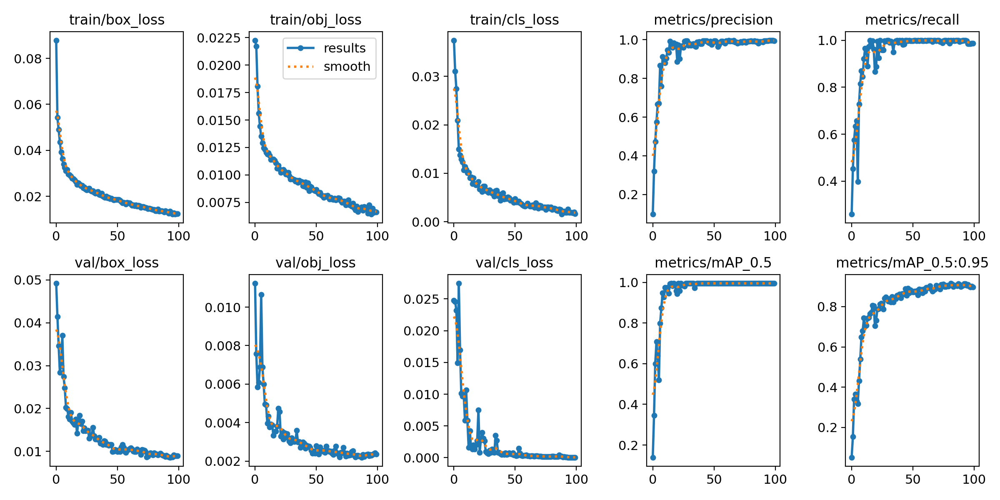

In [36]:
from IPython.display import Image, display

display(Image(
    filename='/content/yolov5/runs/train/yolov5s_results2/results.png'
))

GROUND TRUTH TRAINING DATA:


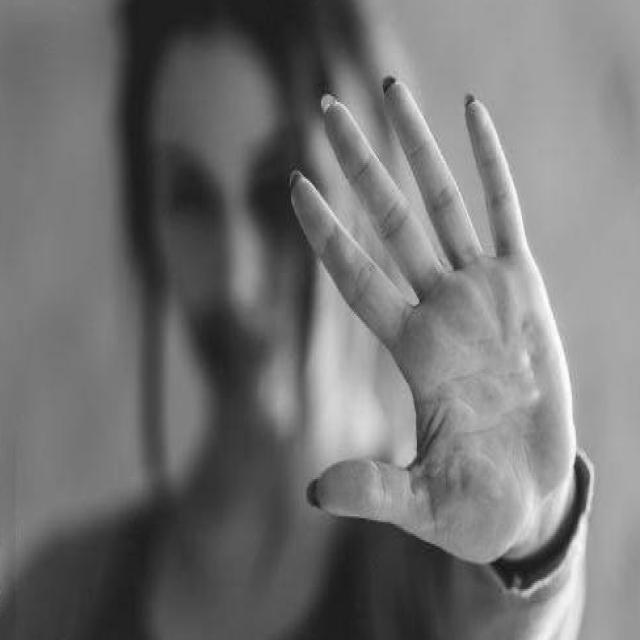

In [37]:
from IPython.display import Image, display

print("GROUND TRUTH TRAINING DATA:")

display(Image(
    filename='/content/SignLanguageDataset/train/images/001_jpg.rf.7ce088853d52a037fd13e2c2e5e5fd6f.jpg'
))

AUGMENTED IMAGE OF TRAINING DATA:


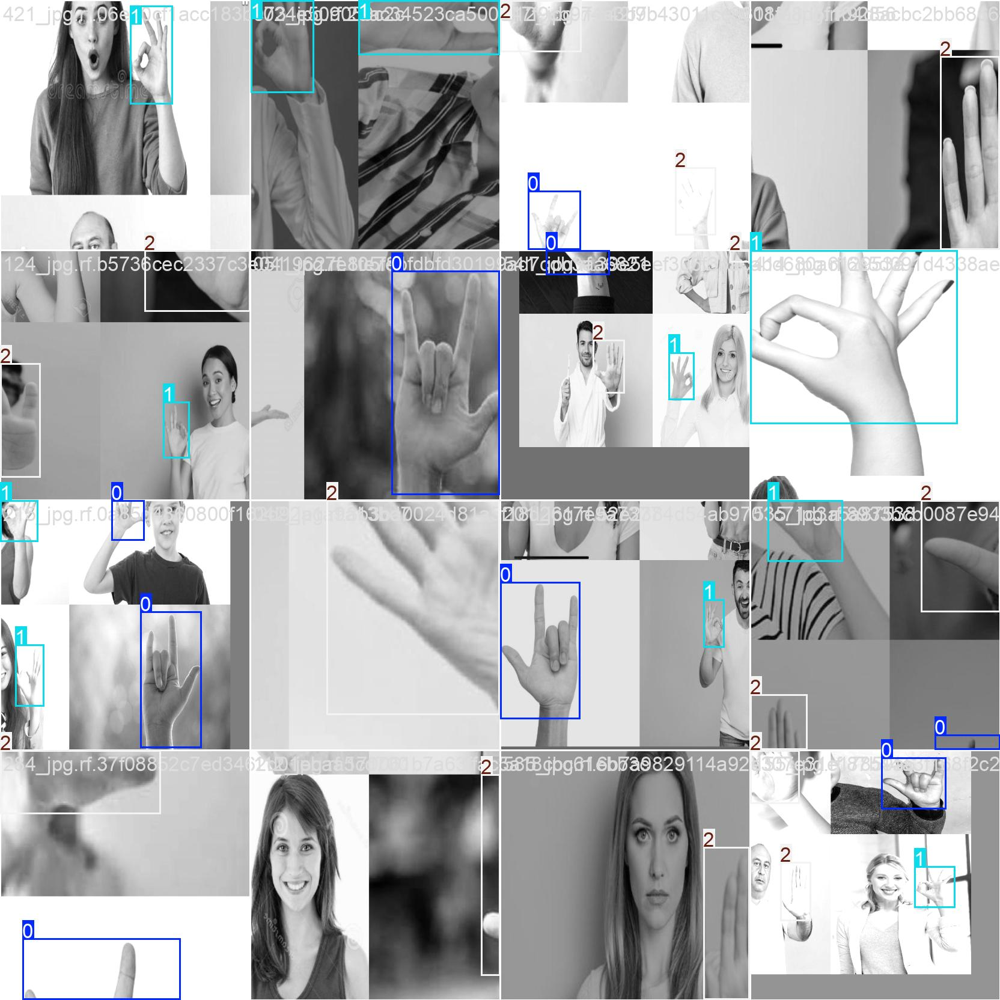

In [38]:
from IPython.display import Image, display

print("AUGMENTED IMAGE OF TRAINING DATA:")

display(Image(
    filename='/content/yolov5/runs/train/yolov5s_results2/train_batch0.jpg'
))

In [39]:
# run inference with trained weights

# trained weights are saved by default in our weights folder

%ls runs/

train/


In [40]:
%ls runs/train/yolov5s_results2/weights

best.pt  last.pt


In [41]:
# when we run this, we saw .007 second inference time. that is 140 fps on a tesla p100
# use the best weights

%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.5 --source /content/SignLanguageDataset/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results2/weights/best.pt'], source=/content/SignLanguageDataset/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-552-g35b48237 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
custom_YOLOv5s summary: 68 layers, 7,018,216 parameters, 0 gradients, 15.8 GFLOPs
image 1/27 /content/SignLanguageDataset/test/images/023_jpg.rf.c1f52d2c1ec41b95b3b99b6ecb50a239.jpg: 416x416 1 stop, 6.0ms
image 2/27 /content/SignLanguageDataset/test/images/028_jpg.rf.1832c8a83c65fda7410fd3ee43764bdf.jpg: 416x416 1 stop, 7.1ms
image 3/27 /content/SignL

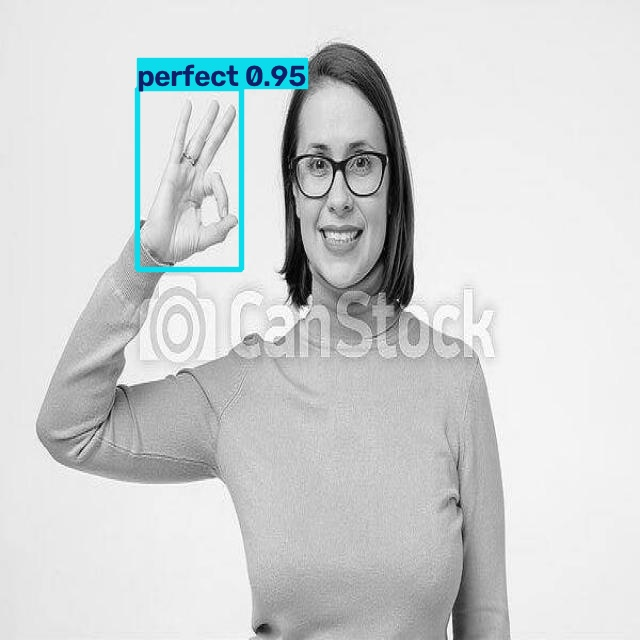

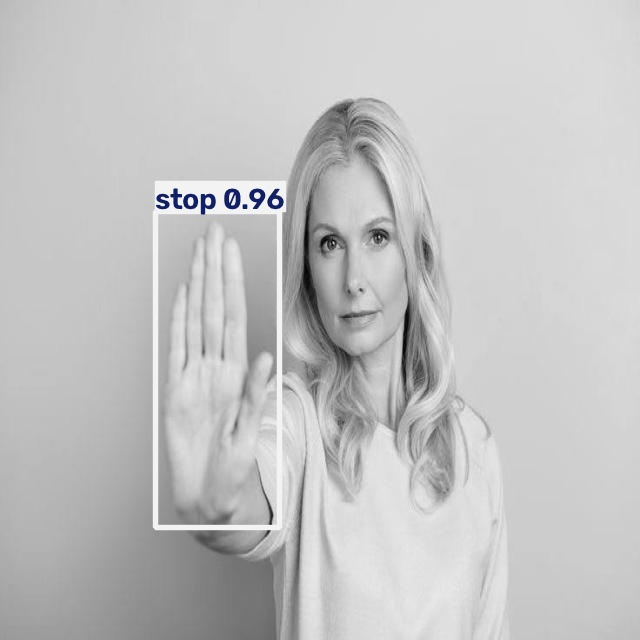

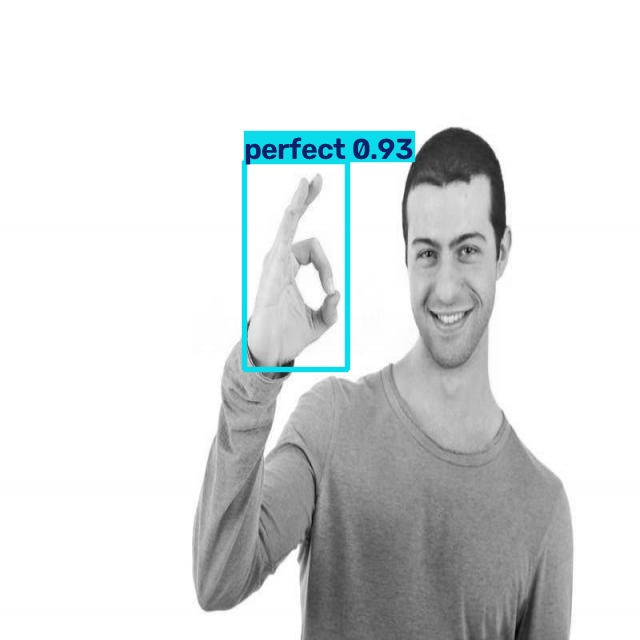

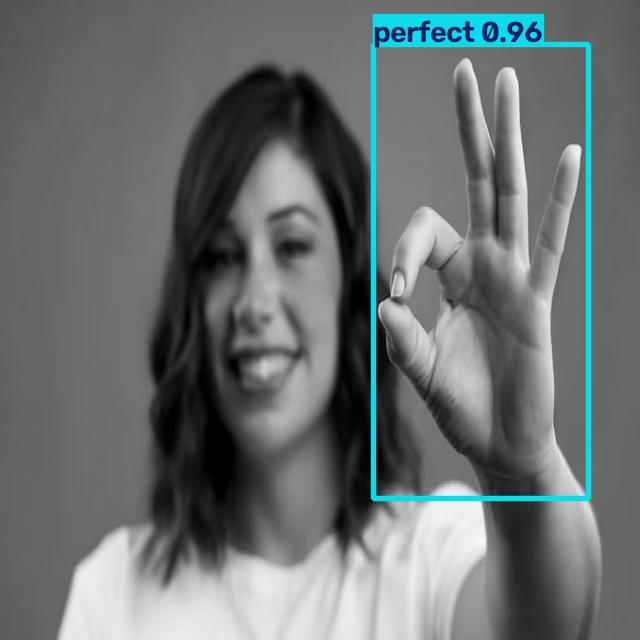

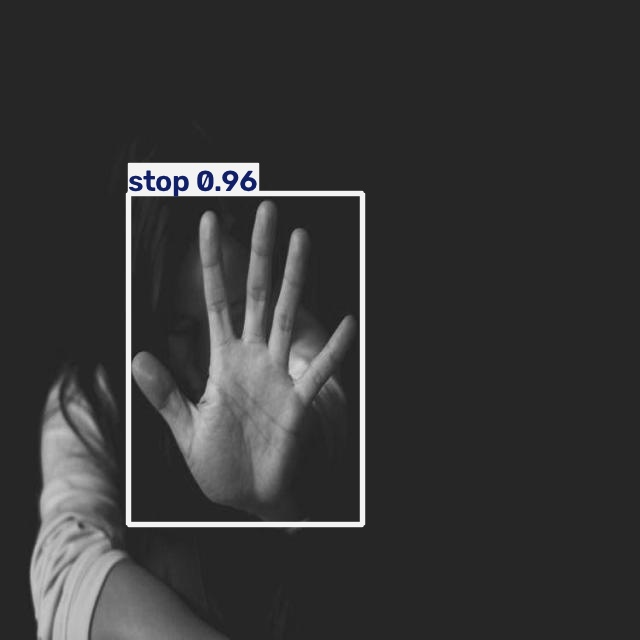

...

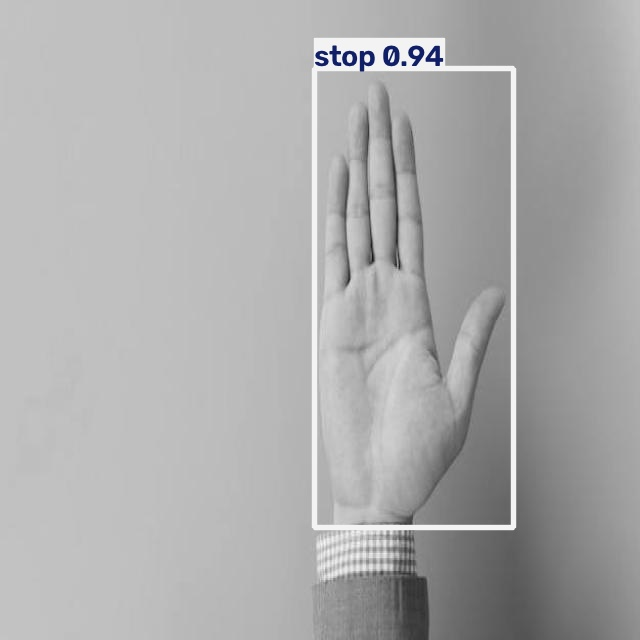

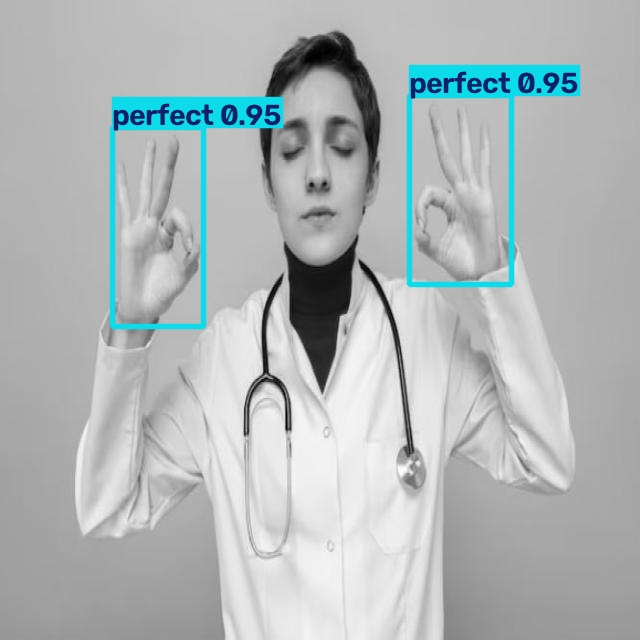

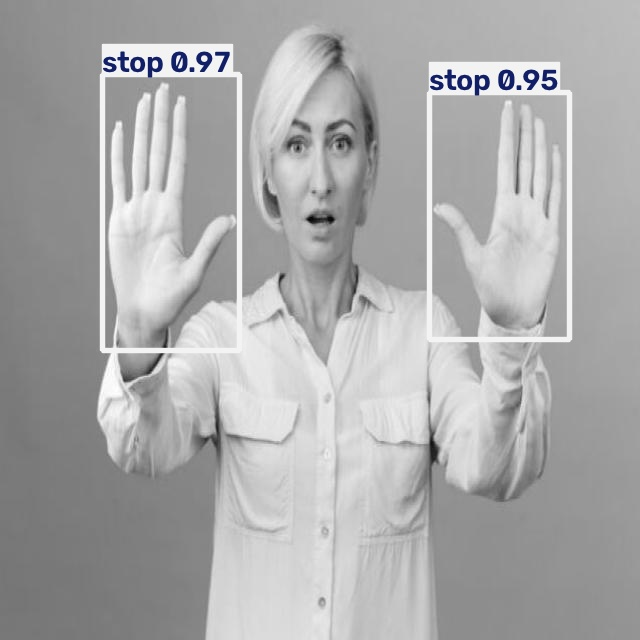

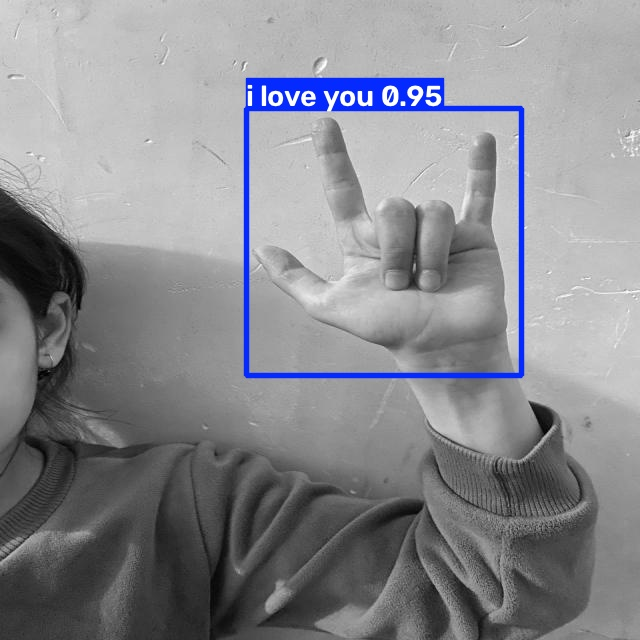

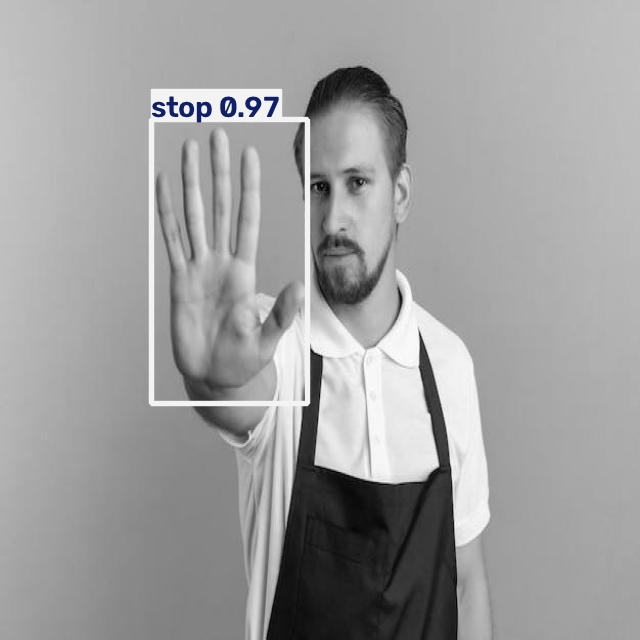

In [43]:
# display inference on ALL test images
# this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=imageName))
    print('\n')

export trained weights for future inference

In [44]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [47]:
!cp /content/yolov5/runs/train/yolov5s_results2/weights/best.pt /content/gdrive/MyDrive/Research/